In [ ]:
from IPython.display import clear_output
from google.colab import files
files.upload()
# from google.colab import drive
# drive.mount('/content/drive')
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d atulanandjha/lfwpeople
!unzip lfwpeople.zip
!tar -xvzf lfw-funneled.tgz
!rm lfw-funneled.tgz lfwpeople.zip
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2
clear_output()

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import torch
import torchvision
import torch.nn as nn
from torchvision import transforms as T

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import dlib
from glob import glob
from tqdm.notebook import tqdm

In [ ]:
img_dir = glob('lfw_funneled/'+'/*/*')
img_dir = [str(x) for x in img_dir]

df = pd.DataFrame(img_dir, columns=['Image_dir'])
df['Name'] = df['Image_dir'].str.split('/', expand=True).loc[:, [1,]]

bush_data = df[df.Name == 'George_W_Bush']
powel_data = df[df.Name == 'Colin_Powell']

In [ ]:
torch.random.manual_seed(123)
torch.cuda.manual_seed(123)

IMAGE_SIZE = 64
BATCH_SIZE = 16  # 1: 32
epochs = 500
PATH = r'model.pth' 

predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
dlib_rect = dlib.rectangle(0, 0, IMAGE_SIZE, IMAGE_SIZE)  # assuming image size given for cropped face

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def crop_face(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(30, 30))
    if len(faces) > 0:
        for x, y, w, h in faces:
            image2 = image[y: y+h, x: x+w, :]
        image2 = cv2.resize(image2, (IMAGE_SIZE, IMAGE_SIZE))
        return image2, 1
    return image, 0

def extract_face(image: np.ndarray) -> np.ndarray:
    landmarks = predictor(image, dlib_rect).parts()
    landmarks = np.array([[p.x,p.y] for p in landmarks])
    
    outline = landmarks[[*range(17), *range(26,16,-1)]]
    feature_mask = np.zeros((image.shape[0], image.shape[1]))   
    out_face = np.zeros_like(image)

    remapped_shape = cv2.convexHull(outline)
    cv2.fillConvexPoly(feature_mask, remapped_shape[0:27], 1)
    feature_mask = feature_mask.astype(np.bool)
    out_face[feature_mask] = image[feature_mask]

    return out_face

In [ ]:
# get cropped faces
bush_images, powel_images = [], []
for dataset in [bush_data, powel_data]:
    name = dataset.iloc[0,1]
    for path in dataset['Image_dir'].values:
        img = cv2.imread(path)
        img, is_detected = crop_face(img)
        if is_detected:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            if name == 'George_W_Bush':
                bush_images.append(img)
            else:
                powel_images.append(img)
        else:
            continue
            
bush_images = np.array(bush_images)
powel_images = np.array(powel_images)

In [ ]:
# clean artefacts
powel_images = np.delete(powel_images, [3, 47, 82, 84, 100, 118, 154, 177, 189, 226, 234], axis=0)
bush_images = np.delete(bush_images, [35, 72, 98, 102, 106, 165, 172, 208, 211, ], axis=0)

In [ ]:
"""
fig, ax = plt.subplots(nrows=24, ncols=10, figsize=(10*2, 24*2))
for i, x in enumerate(np.linspace(0, 240, 25)):
    for j in range(10):
        try:
            ax[i, j].imshow(powel_images[:235][int(x)+j])
            ax[i, j].set_title(x+j)
        except IndexError:
            continue

plt.tight_layout()
plt.show()
"""

In [ ]:
# skip as no improvement
for i in range(bush_images.shape[0]):
    bush_images[i, ...] = extract_face(bush_images[i])

for i in range(powel_images.shape[0]):
    powel_images[i, ...] = extract_face(powel_images[i])

In [41]:
class SwapDataset(torch.utils.data.Dataset):
    def __init__(self, dataA, dataB):
        self.dataA = np.concatenate([face[None] for face in dataA])/255.
        self.dataB = np.concatenate([face[None] for face in dataB])/255.

    def __len__(self):
        return min(len(self.dataA), len(self.dataB))

    def __getitem__(self, ix):
        imgA, imgB = self.dataA[ix], self.dataB[ix]
        return imgA, imgB

    def collate_fn(self, batch):
        imgsA, imgsB = list(zip(*batch))
        imgsA, imgsB = [torch.Tensor(i).permute(0,3,1,2).to(device) for i in [imgsA, imgsB]]
        return imgsA, imgsB

In [42]:
dataset = SwapDataset(bush_images, powel_images)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=dataset.collate_fn)

In [43]:
class Reshape(nn.Module):
    def __init__(self, shape):
        super().__init__()
        self.shape = shape
        
    def forward(self, input):
        return input.view(-1, *self.shape)

class SwapNet(nn.Module):
    def __init__(self):
        super(SwapNet, self).__init__()
        self.encoder = nn.Sequential(
                                    nn.Conv2d(3, 512, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Conv2d(512, 512, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Conv2d(512, 256, 4, stride=2, padding=1), 
                                    nn.LeakyReLU(0.1,True),
                        
                                    nn.Conv2d(256, 128, 4, stride=2, padding=1),
                                    nn.LeakyReLU(0.1, True),
                        
                                    nn.Flatten(),
                                    nn.Tanh(),            
                                    nn.Linear(2048, 1024),
                                    nn.Sigmoid()
                                    )
        
        self.mean = nn.Linear(1024, 512)  # 1: 1024
        self.std = nn.Linear(1024, 512)  # 1: 1024

        self.decoder_A = nn.Sequential(
                                       nn.Linear(512, 2048),  # 1: 1024
                                       nn.Tanh(),
                                       Reshape(shape=(128, 4, 4)), 

                                       nn.ConvTranspose2d(128, 256, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(256, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1),
                                       nn.LeakyReLU(0.1, True),

                                       nn.ConvTranspose2d(512, 3, kernel_size=4, stride=2, padding=1),
                                       nn.Sigmoid(),
                                       )
        self.decoder_B = nn.Sequential(
                                       nn.Linear(512, 2048),  # 1: 1024
                                       nn.Tanh(),
                                       Reshape(shape=(128, 4, 4)),  
                                                 
                                       nn.ConvTranspose2d(128, 256, kernel_size=4, stride=2, padding=1),  
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(256, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, False),

                                       nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1), 
                                       nn.LeakyReLU(0.1, True),

                                       nn.ConvTranspose2d(512, 3, kernel_size=4, stride=2, padding=1),
                                       nn.Sigmoid(),
                                       )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        sample = mu + (eps * std) 
        return sample

    def forward(self, x, select='A'):
        x = self.encoder(x)
  
        mu, logvar = self.mean(x), self.std(x)
        z = self.reparameterize(mu, logvar)

        if select == 'A':
            y = self.decoder_A(z)
        else:
            y = self.decoder_B(z)
        
        return y, mu, logvar

In [44]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.discriminator = nn.Sequential(
                                           nn.utils.spectral_norm(nn.Conv2d(3, 256, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),
                                           nn.utils.spectral_norm(nn.Conv2d(256, 128, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),    
                                           nn.utils.spectral_norm(nn.Conv2d(128, 64, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),   
                                           nn.utils.spectral_norm(nn.Conv2d(64, 32, kernel_size=3, stride=2, padding=1)),
                                           nn.ReLU(True),   
                                           nn.Flatten(),   
                                           nn.utils.spectral_norm(nn.Linear(512, 128)),
                                           nn.LeakyReLU(0.1, True), 
                                           nn.Linear(128, 1),
                                           nn.Sigmoid(),
                                           ) 
    def forward(self, x):
        return self.discriminator(x)

In [45]:
def load_model(path, device=device):
    checkpoint = torch.load(path, map_location=torch.device(device))
    epoch = checkpoint['epoch']
    model = checkpoint['model']
    D_A = checkpoint['D_A']
    D_B = checkpoint['D_B']
    optimizerA = checkpoint['optimizerA']
    optimizerB = checkpoint['optimizerB']
    optimizerD_A = checkpoint['optimizerD_A']
    optimizerD_B = checkpoint['optimizerD_B']
    return model, D_A, D_B, optimizerA, optimizerB, optimizerD_A, optimizerD_B, epoch

In [46]:
# to init weights with normal distribution
def weights_init(obj):
    classname = obj.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(obj.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        torch.nn.init.normal_(obj.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(obj.bias.data, 0.0)

In [47]:
model = SwapNet().to(device).apply(weights_init)

D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

In [ ]:
from torchsummary import summary

summary(model, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 512, 32, 32]          25,088
         LeakyReLU-2          [-1, 512, 32, 32]               0
            Conv2d-3          [-1, 512, 16, 16]       4,194,816
         LeakyReLU-4          [-1, 512, 16, 16]               0
            Conv2d-5            [-1, 256, 8, 8]       2,097,408
         LeakyReLU-6            [-1, 256, 8, 8]               0
            Conv2d-7            [-1, 128, 4, 4]         524,416
         LeakyReLU-8            [-1, 128, 4, 4]               0
           Flatten-9                 [-1, 2048]               0
             Tanh-10                 [-1, 2048]               0
           Linear-11                 [-1, 1024]       2,098,176
          Sigmoid-12                 [-1, 1024]               0
           Linear-13                  [-1, 512]         524,800
           Linear-14                  [

In [ ]:
summary(D_A, (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 256, 32, 32]           7,168
              ReLU-2          [-1, 256, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         295,040
              ReLU-4          [-1, 128, 16, 16]               0
            Conv2d-5             [-1, 64, 8, 8]          73,792
              ReLU-6             [-1, 64, 8, 8]               0
            Conv2d-7             [-1, 32, 4, 4]          18,464
              ReLU-8             [-1, 32, 4, 4]               0
           Flatten-9                  [-1, 512]               0
           Linear-10                  [-1, 128]          65,664
        LeakyReLU-11                  [-1, 128]               0
           Linear-12                    [-1, 1]             129
          Sigmoid-13                    [-1, 1]               0
Total params: 460,257
Trainable params:

In [48]:
class KLDLoss(nn.Module):
    def forward(self, mu, logvar):
        kld = -0.5 * torch.sum(1 + logvar - torch.pow(mu, 2) - torch.exp(logvar))
        return kld

# another approach for kld loss
class KLDLossScaled(nn.Module):
    def forward(self, mean, logvar):
        latent_kl = -0.5 * (1 + logvar - mean.pow(2) - logvar.exp()).mean(dim=0)
        total_kl = latent_kl.sum()
        return total_kl    

reconstruction_loss = torch.nn.functional.binary_cross_entropy
kld_loss = KLDLoss()

criterion = lambda y, x, mu, logvar: reconstruction_loss(y, x, reduction='sum') + kld_loss(mu, logvar)

optimizerA = torch.optim.Adam(
    [{'params': model.encoder.parameters()}, {'params': model.std.parameters()}, {'params': model.mean.parameters()}, {'params': model.decoder_A.parameters()}], 
    lr=5e-5,betas=(0.5, 0.999), weight_decay=5e-6,
) 
optimizerB = torch.optim.Adam(
    [{'params': model.encoder.parameters()}, {'params': model.std.parameters()}, {'params': model.mean.parameters()}, {'params': model.decoder_B.parameters()}], 
    lr=5e-5, betas=(0.5, 0.999), weight_decay=5e-6,
)

criterion_D = nn.BCELoss()

optimizerD_A = torch.optim.SGD(D_A.parameters(), lr=5e-3, weight_decay=5e-6)
optimizerD_B = torch.optim.SGD(D_B.parameters(), lr=5e-3, weight_decay=5e-6)

In [49]:
def train_discriminator(D, criterion, optimizer, real, fake):
    optimizer.zero_grad()

    with torch.set_grad_enabled(True):
        pred_real = D(real)
        pred_fake = D(fake.detach()) 
        
        loss_real = criterion(pred_real, torch.ones(real.size(0), 1).to(device))  # torch.full_like(real, 0.9)
        loss_fake = criterion(pred_fake, torch.zeros(fake.size(0), 1).to(device))

        loss = loss_real + loss_fake  # * 0.5 previously, eliminating increases penalty
        loss.backward(retain_graph=True)

        optimizer.step()

    return loss.item()

# original paper
def train_generator(D, criterion_G, criterion_D, optimizer, x, fake, mu, logvar):
    optimizer.zero_grad()
    
    with torch.set_grad_enabled(True):
        prediction = D(fake.detach()) 

        target = torch.ones(x.size(0), 1).to(device)
        d_loss = criterion_D(prediction, target)
        d_loss.backward(retain_graph=True)
        d_loss = d_loss.item()

        if criterion_G is not None:   
            g_loss = criterion_G(fake, x, mu, logvar)  
            grads = torch.ones_like(g_loss)           
            g_loss.backward(grads, retain_graph=True)
            d_loss += g_loss.mean().item()

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

    return d_loss

In [50]:
def plot_test():
    x_A, x_B = next(iter(dataloader))

    model.eval()
    y = model(x_A, select='B')

    plt.figure(figsize=(8,6))
    plt.subplot(121)
    plt.title('Original')
    plt.imshow(x_A[2].permute(1,2,0).cpu().detach().numpy())
    plt.subplot(122)
    plt.title('Reconstructed')
    rec = y[0][2].clamp(0,1)
    rec_img = rec.permute(1,2,0).cpu().detach().numpy()
    plt.imshow(rec_img)
    plt.show()
    plt.pause(0.001)
    model.train()

In [ ]:
try:
    model, D_A, D_B, optimizerA, optimizerB, optimizerD_A, optimizerD_B, _ = load_model(PATH)
except:
    print("Failed to load checkpoints")

Failed to load checkpoints


Epoch 1/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 67337.1163, d_loss: 1.3867
--------------------------------------------------
Epoch 2/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 66337.2947, d_loss: 1.3862
--------------------------------------------------
Epoch 3/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 66235.9403, d_loss: 1.3859
--------------------------------------------------
Epoch 4/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 66093.0041, d_loss: 1.3857
--------------------------------------------------
Epoch 5/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 65857.5823, d_loss: 1.3856
--------------------------------------------------
Epoch 6/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 65539.1060, d_loss: 1.3857
--------------------------------------------------
Epoch 7/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 65032.4151, d_loss: 1.3858
--------------------------------------------------
Epoch 8/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 64347.7635, d_loss: 1.3859
--------------------------------------------------
Epoch 9/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 63778.3084, d_loss: 1.3859
--------------------------------------------------
Epoch 10/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 63454.8822, d_loss: 1.3859
--------------------------------------------------


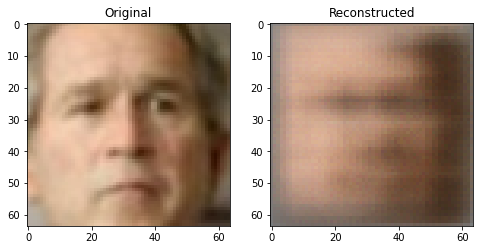

Epoch 11/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 63281.5730, d_loss: 1.3859
--------------------------------------------------
Epoch 12/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 63137.0903, d_loss: 1.3858
--------------------------------------------------
Epoch 13/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62996.7798, d_loss: 1.3858
--------------------------------------------------
Epoch 14/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62880.4583, d_loss: 1.3858
--------------------------------------------------
Epoch 15/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62803.3882, d_loss: 1.3857
--------------------------------------------------
Epoch 16/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62727.4317, d_loss: 1.3857
--------------------------------------------------
Epoch 17/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62638.0852, d_loss: 1.3857
--------------------------------------------------
Epoch 18/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62593.4277, d_loss: 1.3857
--------------------------------------------------
Epoch 19/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62506.4220, d_loss: 1.3856
--------------------------------------------------
Epoch 20/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62436.2940, d_loss: 1.3856
--------------------------------------------------


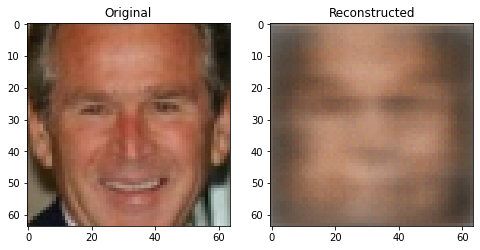

Epoch 21/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62395.0824, d_loss: 1.3857
--------------------------------------------------
Epoch 22/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62341.3481, d_loss: 1.3856
--------------------------------------------------
Epoch 23/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62326.8227, d_loss: 1.3856
--------------------------------------------------
Epoch 24/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62246.0724, d_loss: 1.3856
--------------------------------------------------
Epoch 25/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62249.7793, d_loss: 1.3856
--------------------------------------------------
Epoch 26/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62224.2451, d_loss: 1.3856
--------------------------------------------------
Epoch 27/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62158.2395, d_loss: 1.3856
--------------------------------------------------
Epoch 28/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62110.0487, d_loss: 1.3856
--------------------------------------------------
Epoch 29/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62098.6856, d_loss: 1.3856
--------------------------------------------------
Epoch 30/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62067.9354, d_loss: 1.3855
--------------------------------------------------


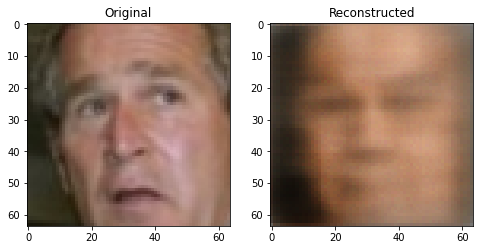

Epoch 31/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62063.2277, d_loss: 1.3856
--------------------------------------------------
Epoch 32/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 62032.3868, d_loss: 1.3855
--------------------------------------------------
Epoch 33/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61978.2744, d_loss: 1.3855
--------------------------------------------------
Epoch 34/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61945.0470, d_loss: 1.3855
--------------------------------------------------
Epoch 35/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61937.4170, d_loss: 1.3855
--------------------------------------------------
Epoch 36/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61902.6123, d_loss: 1.3855
--------------------------------------------------
Epoch 37/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61927.3544, d_loss: 1.3855
--------------------------------------------------
Epoch 38/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61900.4766, d_loss: 1.3855
--------------------------------------------------
Epoch 39/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61865.1723, d_loss: 1.3855
--------------------------------------------------
Epoch 40/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61862.6653, d_loss: 1.3855
--------------------------------------------------


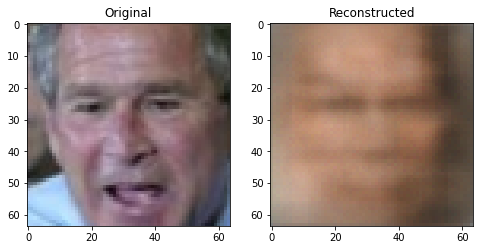

Epoch 41/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61825.0106, d_loss: 1.3855
--------------------------------------------------
Epoch 42/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61817.0025, d_loss: 1.3855
--------------------------------------------------
Epoch 43/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61855.7717, d_loss: 1.3854
--------------------------------------------------
Epoch 44/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61810.5492, d_loss: 1.3855
--------------------------------------------------
Epoch 45/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61785.0111, d_loss: 1.3854
--------------------------------------------------
Epoch 46/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61761.0897, d_loss: 1.3855
--------------------------------------------------
Epoch 47/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61752.6990, d_loss: 1.3854
--------------------------------------------------
Epoch 48/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61774.9296, d_loss: 1.3854
--------------------------------------------------
Epoch 49/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61765.4524, d_loss: 1.3855
--------------------------------------------------
Epoch 50/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61721.3987, d_loss: 1.3854
--------------------------------------------------


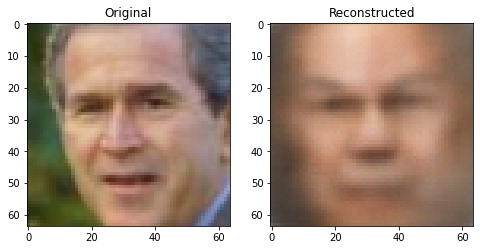

Epoch 51/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61743.2974, d_loss: 1.3854
--------------------------------------------------
Epoch 52/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61709.6658, d_loss: 1.3854
--------------------------------------------------
Epoch 53/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61672.3232, d_loss: 1.3854
--------------------------------------------------
Epoch 54/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61689.9367, d_loss: 1.3854
--------------------------------------------------
Epoch 55/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61659.0777, d_loss: 1.3853
--------------------------------------------------
Epoch 56/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61625.6878, d_loss: 1.3854
--------------------------------------------------
Epoch 57/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61647.1104, d_loss: 1.3854
--------------------------------------------------
Epoch 58/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61641.8421, d_loss: 1.3853
--------------------------------------------------
Epoch 59/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61607.7624, d_loss: 1.3854
--------------------------------------------------
Epoch 60/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61608.1059, d_loss: 1.3854
--------------------------------------------------


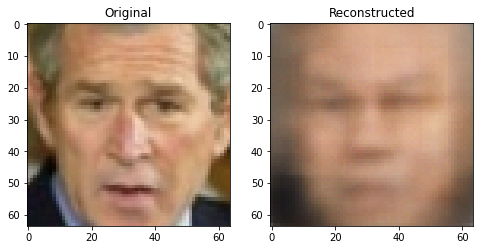

Epoch 61/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61601.3374, d_loss: 1.3853
--------------------------------------------------
Epoch 62/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61600.0695, d_loss: 1.3853
--------------------------------------------------
Epoch 63/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61604.9724, d_loss: 1.3854
--------------------------------------------------
Epoch 64/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61563.4746, d_loss: 1.3853
--------------------------------------------------
Epoch 65/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61519.8366, d_loss: 1.3853
--------------------------------------------------
Epoch 66/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61568.8307, d_loss: 1.3853
--------------------------------------------------
Epoch 67/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61552.0357, d_loss: 1.3853
--------------------------------------------------
Epoch 68/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61521.4657, d_loss: 1.3853
--------------------------------------------------
Epoch 69/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61540.0626, d_loss: 1.3853
--------------------------------------------------
Epoch 70/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61524.1816, d_loss: 1.3853
--------------------------------------------------


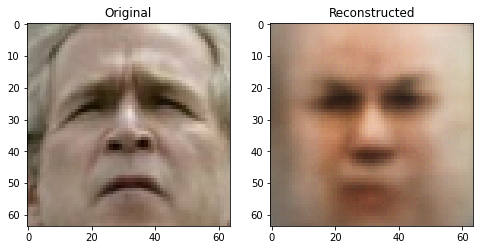

Epoch 71/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61492.2049, d_loss: 1.3853
--------------------------------------------------
Epoch 72/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61521.9715, d_loss: 1.3853
--------------------------------------------------
Epoch 73/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61462.3439, d_loss: 1.3852
--------------------------------------------------
Epoch 74/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61485.6014, d_loss: 1.3853
--------------------------------------------------
Epoch 75/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61453.1292, d_loss: 1.3853
--------------------------------------------------
Epoch 76/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61451.5600, d_loss: 1.3852
--------------------------------------------------
Epoch 77/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61454.5694, d_loss: 1.3852
--------------------------------------------------
Epoch 78/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61449.0547, d_loss: 1.3852
--------------------------------------------------
Epoch 79/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61441.0696, d_loss: 1.3853
--------------------------------------------------
Epoch 80/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61408.5572, d_loss: 1.3852
--------------------------------------------------


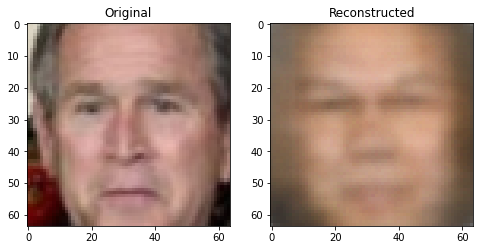

Epoch 81/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61419.9018, d_loss: 1.3852
--------------------------------------------------
Epoch 82/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61403.5931, d_loss: 1.3852
--------------------------------------------------
Epoch 83/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61407.1862, d_loss: 1.3852
--------------------------------------------------
Epoch 84/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61390.0218, d_loss: 1.3852
--------------------------------------------------
Epoch 85/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61371.3436, d_loss: 1.3852
--------------------------------------------------
Epoch 86/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61366.4574, d_loss: 1.3852
--------------------------------------------------
Epoch 87/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61395.1509, d_loss: 1.3852
--------------------------------------------------
Epoch 88/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61353.7971, d_loss: 1.3852
--------------------------------------------------
Epoch 89/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61336.1966, d_loss: 1.3852
--------------------------------------------------
Epoch 90/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61341.0080, d_loss: 1.3852
--------------------------------------------------


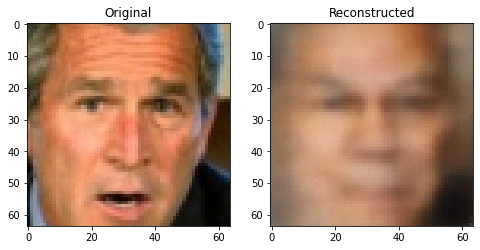

Epoch 91/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61343.6680, d_loss: 1.3852
--------------------------------------------------
Epoch 92/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61293.6353, d_loss: 1.3851
--------------------------------------------------
Epoch 93/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61323.0067, d_loss: 1.3852
--------------------------------------------------
Epoch 94/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61301.0023, d_loss: 1.3852
--------------------------------------------------
Epoch 95/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61315.5655, d_loss: 1.3852
--------------------------------------------------
Epoch 96/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61281.8155, d_loss: 1.3852
--------------------------------------------------
Epoch 97/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61292.9117, d_loss: 1.3851
--------------------------------------------------
Epoch 98/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61249.4291, d_loss: 1.3851
--------------------------------------------------
Epoch 99/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61294.6362, d_loss: 1.3851
--------------------------------------------------
Epoch 100/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61261.2031, d_loss: 1.3851
--------------------------------------------------


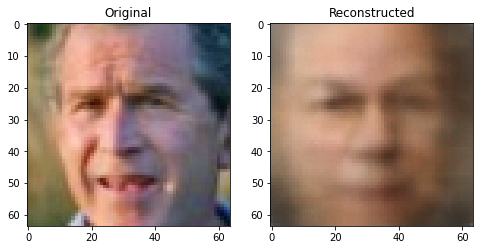

Epoch 101/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61230.0303, d_loss: 1.3851
--------------------------------------------------
Epoch 102/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61249.6364, d_loss: 1.3851
--------------------------------------------------
Epoch 103/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61226.1369, d_loss: 1.3851
--------------------------------------------------
Epoch 104/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61216.3385, d_loss: 1.3851
--------------------------------------------------
Epoch 105/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61241.2034, d_loss: 1.3850
--------------------------------------------------
Epoch 106/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61193.9429, d_loss: 1.3851
--------------------------------------------------
Epoch 107/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61204.5456, d_loss: 1.3851
--------------------------------------------------
Epoch 108/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61195.1696, d_loss: 1.3850
--------------------------------------------------
Epoch 109/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61219.4297, d_loss: 1.3850
--------------------------------------------------
Epoch 110/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61188.9958, d_loss: 1.3850
--------------------------------------------------


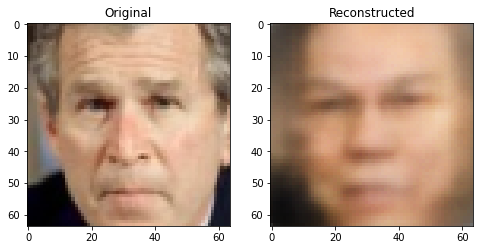

Epoch 111/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61169.9952, d_loss: 1.3850
--------------------------------------------------
Epoch 112/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61154.1845, d_loss: 1.3850
--------------------------------------------------
Epoch 113/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61182.5464, d_loss: 1.3850
--------------------------------------------------
Epoch 114/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61152.4492, d_loss: 1.3850
--------------------------------------------------
Epoch 115/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61137.8977, d_loss: 1.3850
--------------------------------------------------
Epoch 116/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61161.5826, d_loss: 1.3849
--------------------------------------------------
Epoch 117/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61156.6714, d_loss: 1.3849
--------------------------------------------------
Epoch 118/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61140.7010, d_loss: 1.3849
--------------------------------------------------
Epoch 119/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61134.4803, d_loss: 1.3849
--------------------------------------------------
Epoch 120/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61130.9262, d_loss: 1.3849
--------------------------------------------------


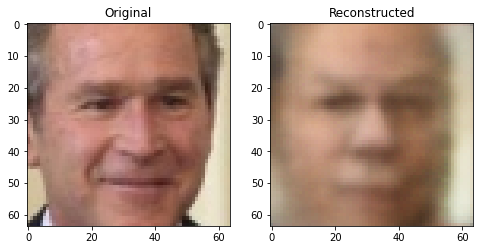

Epoch 121/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61144.0825, d_loss: 1.3849
--------------------------------------------------
Epoch 122/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61108.4259, d_loss: 1.3849
--------------------------------------------------
Epoch 123/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61112.5441, d_loss: 1.3850
--------------------------------------------------
Epoch 124/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61086.5231, d_loss: 1.3849
--------------------------------------------------
Epoch 125/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61089.5400, d_loss: 1.3848
--------------------------------------------------
Epoch 126/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61114.0769, d_loss: 1.3849
--------------------------------------------------
Epoch 127/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61077.1521, d_loss: 1.3848
--------------------------------------------------
Epoch 128/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61070.2433, d_loss: 1.3848
--------------------------------------------------
Epoch 129/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61086.7284, d_loss: 1.3849
--------------------------------------------------
Epoch 130/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61086.4265, d_loss: 1.3849
--------------------------------------------------


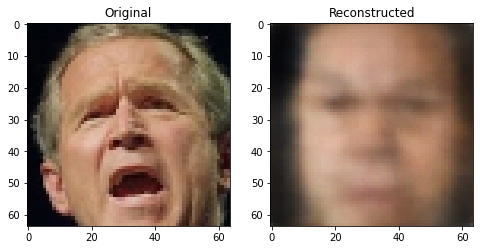

Epoch 131/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61060.4659, d_loss: 1.3848
--------------------------------------------------
Epoch 132/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61057.3691, d_loss: 1.3848
--------------------------------------------------
Epoch 133/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61040.7648, d_loss: 1.3848
--------------------------------------------------
Epoch 134/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61081.5203, d_loss: 1.3848
--------------------------------------------------
Epoch 135/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61051.4764, d_loss: 1.3848
--------------------------------------------------
Epoch 136/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61034.2908, d_loss: 1.3847
--------------------------------------------------
Epoch 137/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61033.4185, d_loss: 1.3848
--------------------------------------------------
Epoch 138/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61022.8032, d_loss: 1.3848
--------------------------------------------------
Epoch 139/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61020.7046, d_loss: 1.3847
--------------------------------------------------
Epoch 140/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61022.4456, d_loss: 1.3848
--------------------------------------------------


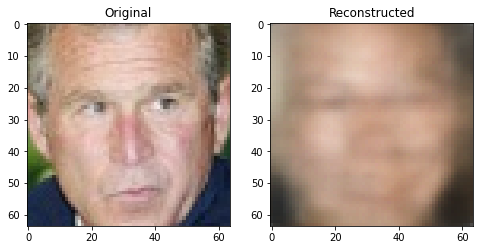

Epoch 141/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61023.5582, d_loss: 1.3848
--------------------------------------------------
Epoch 142/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 61000.9027, d_loss: 1.3847
--------------------------------------------------
Epoch 143/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60980.4197, d_loss: 1.3847
--------------------------------------------------
Epoch 144/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60991.9574, d_loss: 1.3847
--------------------------------------------------
Epoch 145/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60986.0480, d_loss: 1.3847
--------------------------------------------------
Epoch 146/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60978.9475, d_loss: 1.3847
--------------------------------------------------
Epoch 147/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60987.5028, d_loss: 1.3846
--------------------------------------------------
Epoch 148/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60990.2876, d_loss: 1.3846
--------------------------------------------------
Epoch 149/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60968.5217, d_loss: 1.3847
--------------------------------------------------
Epoch 150/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60968.2900, d_loss: 1.3846
--------------------------------------------------


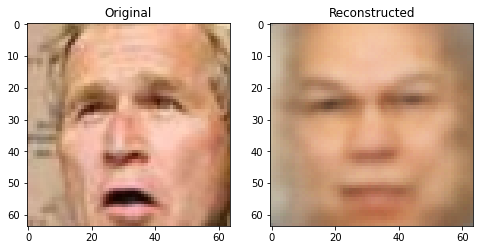

Epoch 151/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60977.9625, d_loss: 1.3846
--------------------------------------------------
Epoch 152/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60962.2885, d_loss: 1.3846
--------------------------------------------------
Epoch 153/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60954.9891, d_loss: 1.3846
--------------------------------------------------
Epoch 154/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60926.7078, d_loss: 1.3847
--------------------------------------------------
Epoch 155/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60936.8587, d_loss: 1.3845
--------------------------------------------------
Epoch 156/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60946.4274, d_loss: 1.3846
--------------------------------------------------
Epoch 157/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60948.8812, d_loss: 1.3845
--------------------------------------------------
Epoch 158/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60926.2568, d_loss: 1.3845
--------------------------------------------------
Epoch 159/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60904.2492, d_loss: 1.3846
--------------------------------------------------
Epoch 160/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60886.0079, d_loss: 1.3845
--------------------------------------------------


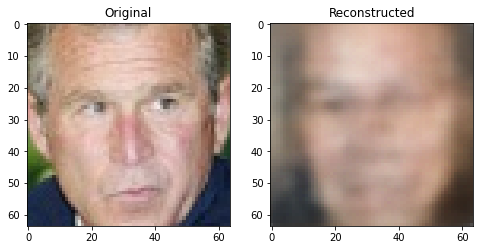

Epoch 161/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60915.1086, d_loss: 1.3844
--------------------------------------------------
Epoch 162/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60927.0096, d_loss: 1.3845
--------------------------------------------------
Epoch 163/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60902.1382, d_loss: 1.3844
--------------------------------------------------
Epoch 164/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60912.7878, d_loss: 1.3845
--------------------------------------------------
Epoch 165/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60902.8928, d_loss: 1.3844
--------------------------------------------------
Epoch 166/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60891.2641, d_loss: 1.3845
--------------------------------------------------
Epoch 167/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60886.2120, d_loss: 1.3844
--------------------------------------------------
Epoch 168/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60889.0229, d_loss: 1.3844
--------------------------------------------------
Epoch 169/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60893.6357, d_loss: 1.3844
--------------------------------------------------
Epoch 170/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60885.4572, d_loss: 1.3844
--------------------------------------------------


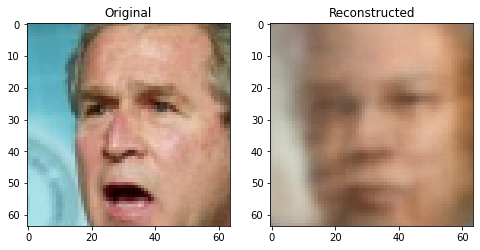

Epoch 171/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60865.9474, d_loss: 1.3843
--------------------------------------------------
Epoch 172/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60864.2944, d_loss: 1.3844
--------------------------------------------------
Epoch 173/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60849.7582, d_loss: 1.3842
--------------------------------------------------
Epoch 174/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60844.3900, d_loss: 1.3843
--------------------------------------------------
Epoch 175/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60839.9065, d_loss: 1.3842
--------------------------------------------------
Epoch 176/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60842.0304, d_loss: 1.3842
--------------------------------------------------
Epoch 177/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60845.5964, d_loss: 1.3842
--------------------------------------------------
Epoch 178/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60849.2089, d_loss: 1.3843
--------------------------------------------------
Epoch 179/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60840.3300, d_loss: 1.3842
--------------------------------------------------
Epoch 180/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60826.1312, d_loss: 1.3842
--------------------------------------------------


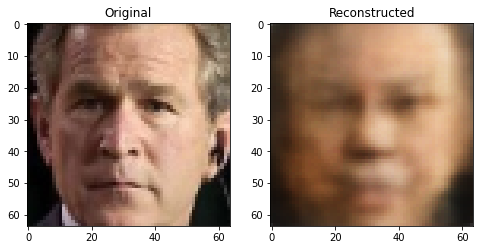

Epoch 181/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60802.5214, d_loss: 1.3841
--------------------------------------------------
Epoch 182/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60812.5927, d_loss: 1.3841
--------------------------------------------------
Epoch 183/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60809.8879, d_loss: 1.3841
--------------------------------------------------
Epoch 184/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60799.1542, d_loss: 1.3840
--------------------------------------------------
Epoch 185/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60796.9273, d_loss: 1.3841
--------------------------------------------------
Epoch 186/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60806.7991, d_loss: 1.3840
--------------------------------------------------
Epoch 187/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60769.9890, d_loss: 1.3840
--------------------------------------------------
Epoch 188/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60783.3950, d_loss: 1.3838
--------------------------------------------------
Epoch 189/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60777.3365, d_loss: 1.3840
--------------------------------------------------
Epoch 190/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60780.9021, d_loss: 1.3839
--------------------------------------------------


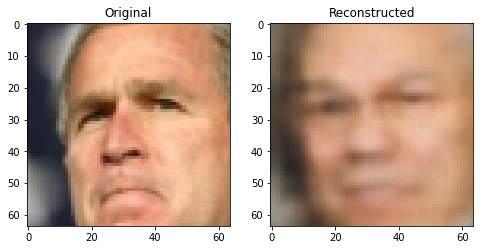

Epoch 191/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60791.3846, d_loss: 1.3839
--------------------------------------------------
Epoch 192/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60753.2081, d_loss: 1.3839
--------------------------------------------------
Epoch 193/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60748.6667, d_loss: 1.3839
--------------------------------------------------
Epoch 194/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60742.7991, d_loss: 1.3838
--------------------------------------------------
Epoch 195/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60782.5471, d_loss: 1.3838
--------------------------------------------------
Epoch 196/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60746.1886, d_loss: 1.3838
--------------------------------------------------
Epoch 197/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60737.5931, d_loss: 1.3837
--------------------------------------------------
Epoch 198/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60710.6348, d_loss: 1.3837
--------------------------------------------------
Epoch 199/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60717.2590, d_loss: 1.3836
--------------------------------------------------
Epoch 200/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60720.5967, d_loss: 1.3836
--------------------------------------------------


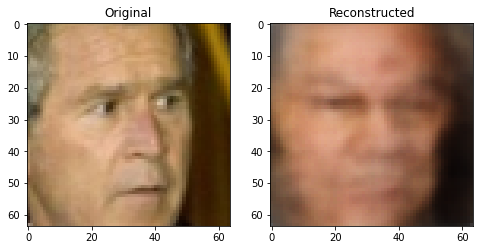

Epoch 201/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60721.9693, d_loss: 1.3836
--------------------------------------------------
Epoch 202/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60727.4747, d_loss: 1.3836
--------------------------------------------------
Epoch 203/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60720.0397, d_loss: 1.3835
--------------------------------------------------
Epoch 204/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60716.0508, d_loss: 1.3836
--------------------------------------------------
Epoch 205/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60720.9054, d_loss: 1.3835
--------------------------------------------------
Epoch 206/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60703.4986, d_loss: 1.3834
--------------------------------------------------
Epoch 207/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60719.1478, d_loss: 1.3834
--------------------------------------------------
Epoch 208/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60693.3289, d_loss: 1.3835
--------------------------------------------------
Epoch 209/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60670.9691, d_loss: 1.3833
--------------------------------------------------
Epoch 210/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60682.1419, d_loss: 1.3834
--------------------------------------------------


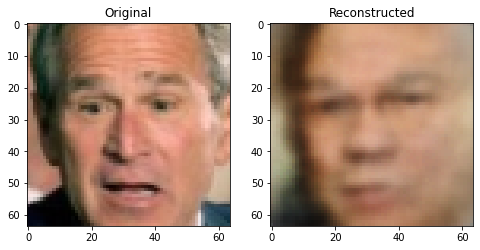

Epoch 211/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60649.6963, d_loss: 1.3833
--------------------------------------------------
Epoch 212/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60668.7705, d_loss: 1.3833
--------------------------------------------------
Epoch 213/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60683.1859, d_loss: 1.3831
--------------------------------------------------
Epoch 214/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60657.7182, d_loss: 1.3832
--------------------------------------------------
Epoch 215/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60671.6514, d_loss: 1.3832
--------------------------------------------------
Epoch 216/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60653.7675, d_loss: 1.3832
--------------------------------------------------
Epoch 217/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60669.2949, d_loss: 1.3830
--------------------------------------------------
Epoch 218/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60666.0361, d_loss: 1.3832
--------------------------------------------------
Epoch 219/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60662.0227, d_loss: 1.3831
--------------------------------------------------
Epoch 220/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60659.9093, d_loss: 1.3829
--------------------------------------------------


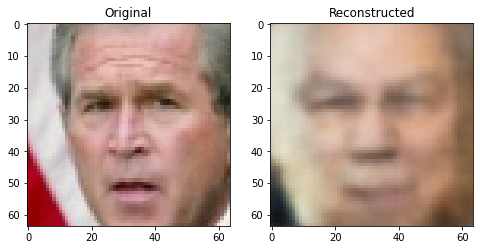

Epoch 221/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60601.2752, d_loss: 1.3828
--------------------------------------------------
Epoch 222/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60608.5484, d_loss: 1.3830
--------------------------------------------------
Epoch 223/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60614.4840, d_loss: 1.3830
--------------------------------------------------
Epoch 224/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60607.4133, d_loss: 1.3827
--------------------------------------------------
Epoch 225/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60609.4202, d_loss: 1.3826
--------------------------------------------------
Epoch 226/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60613.8296, d_loss: 1.3827
--------------------------------------------------
Epoch 227/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60586.6672, d_loss: 1.3827
--------------------------------------------------
Epoch 228/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60599.3572, d_loss: 1.3826
--------------------------------------------------
Epoch 229/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60611.7562, d_loss: 1.3825
--------------------------------------------------
Epoch 230/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60563.1064, d_loss: 1.3825
--------------------------------------------------


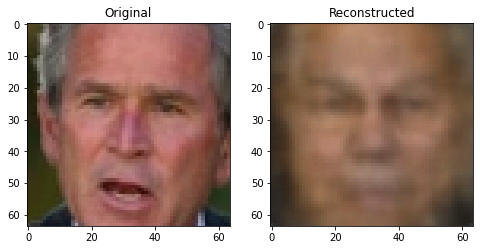

Epoch 231/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60601.8575, d_loss: 1.3824
--------------------------------------------------
Epoch 232/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60610.0050, d_loss: 1.3825
--------------------------------------------------
Epoch 233/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60572.9367, d_loss: 1.3822
--------------------------------------------------
Epoch 234/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60571.5842, d_loss: 1.3824
--------------------------------------------------
Epoch 235/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60557.1157, d_loss: 1.3821
--------------------------------------------------
Epoch 236/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60565.6130, d_loss: 1.3821
--------------------------------------------------
Epoch 237/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60558.2450, d_loss: 1.3820
--------------------------------------------------
Epoch 238/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60547.1086, d_loss: 1.3822
--------------------------------------------------
Epoch 239/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60537.7466, d_loss: 1.3820
--------------------------------------------------
Epoch 240/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60533.2108, d_loss: 1.3820
--------------------------------------------------


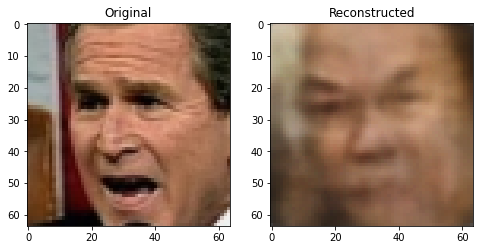

Epoch 241/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60563.4815, d_loss: 1.3816
--------------------------------------------------
Epoch 242/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60546.6260, d_loss: 1.3817
--------------------------------------------------
Epoch 243/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60529.5746, d_loss: 1.3815
--------------------------------------------------
Epoch 244/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60524.7764, d_loss: 1.3817
--------------------------------------------------
Epoch 245/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60508.4652, d_loss: 1.3815
--------------------------------------------------
Epoch 246/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60532.1618, d_loss: 1.3816
--------------------------------------------------
Epoch 247/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60515.9152, d_loss: 1.3812
--------------------------------------------------
Epoch 248/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60536.5575, d_loss: 1.3812
--------------------------------------------------
Epoch 249/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60504.9291, d_loss: 1.3813
--------------------------------------------------
Epoch 250/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60501.6701, d_loss: 1.3815
--------------------------------------------------


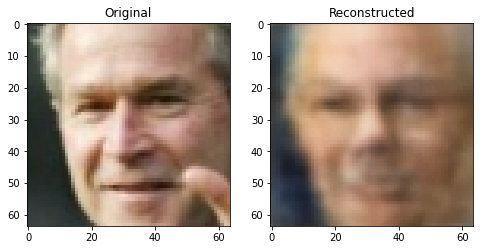

Epoch 251/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60504.3534, d_loss: 1.3811
--------------------------------------------------
Epoch 252/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60514.8140, d_loss: 1.3810
--------------------------------------------------
Epoch 253/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60489.1190, d_loss: 1.3809
--------------------------------------------------
Epoch 254/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60475.2866, d_loss: 1.3808
--------------------------------------------------
Epoch 255/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60454.2074, d_loss: 1.3805
--------------------------------------------------
Epoch 256/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60452.7304, d_loss: 1.3805
--------------------------------------------------
Epoch 257/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60450.3504, d_loss: 1.3805
--------------------------------------------------
Epoch 258/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60452.5463, d_loss: 1.3805
--------------------------------------------------
Epoch 259/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60461.8315, d_loss: 1.3805
--------------------------------------------------
Epoch 260/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60448.8873, d_loss: 1.3802
--------------------------------------------------


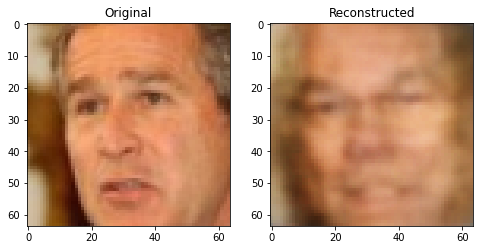

Epoch 261/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60459.2444, d_loss: 1.3803
--------------------------------------------------
Epoch 262/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60450.4283, d_loss: 1.3796
--------------------------------------------------
Epoch 263/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60430.8378, d_loss: 1.3798
--------------------------------------------------
Epoch 264/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60436.6237, d_loss: 1.3793
--------------------------------------------------
Epoch 265/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60423.6673, d_loss: 1.3794
--------------------------------------------------
Epoch 266/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60432.8155, d_loss: 1.3794
--------------------------------------------------
Epoch 267/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60420.7669, d_loss: 1.3790
--------------------------------------------------
Epoch 268/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60422.1516, d_loss: 1.3785
--------------------------------------------------
Epoch 269/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60439.0189, d_loss: 1.3784
--------------------------------------------------
Epoch 270/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60411.3931, d_loss: 1.3783
--------------------------------------------------


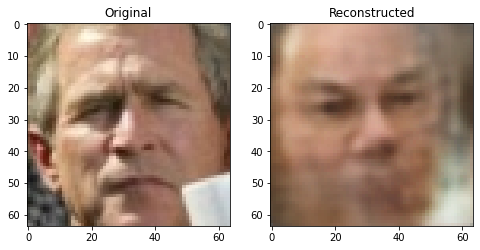

Epoch 271/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60391.2990, d_loss: 1.3782
--------------------------------------------------
Epoch 272/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60381.6176, d_loss: 1.3777
--------------------------------------------------
Epoch 273/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60391.3522, d_loss: 1.3779
--------------------------------------------------
Epoch 274/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60384.0962, d_loss: 1.3772
--------------------------------------------------
Epoch 275/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60376.0765, d_loss: 1.3778
--------------------------------------------------
Epoch 276/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60370.0126, d_loss: 1.3774
--------------------------------------------------
Epoch 277/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60399.3778, d_loss: 1.3775
--------------------------------------------------
Epoch 278/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60365.5867, d_loss: 1.3765
--------------------------------------------------
Epoch 279/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60364.8108, d_loss: 1.3765
--------------------------------------------------
Epoch 280/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60345.3594, d_loss: 1.3767
--------------------------------------------------


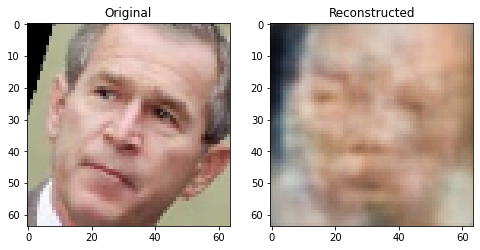

Epoch 281/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60384.4355, d_loss: 1.3765
--------------------------------------------------
Epoch 282/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60338.6570, d_loss: 1.3758
--------------------------------------------------
Epoch 283/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60347.6185, d_loss: 1.3763
--------------------------------------------------
Epoch 284/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60361.5182, d_loss: 1.3758
--------------------------------------------------
Epoch 285/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60355.1042, d_loss: 1.3759
--------------------------------------------------
Epoch 286/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60338.1601, d_loss: 1.3752
--------------------------------------------------
Epoch 287/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60322.5782, d_loss: 1.3745
--------------------------------------------------
Epoch 288/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60324.5721, d_loss: 1.3750
--------------------------------------------------
Epoch 289/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60300.8964, d_loss: 1.3740
--------------------------------------------------
Epoch 290/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60334.5507, d_loss: 1.3739
--------------------------------------------------


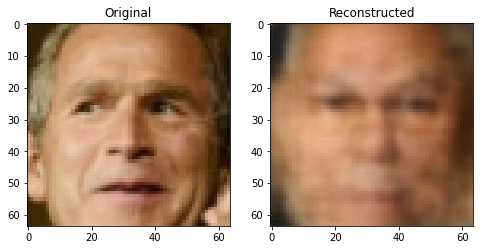

Epoch 291/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60315.4077, d_loss: 1.3739
--------------------------------------------------
Epoch 292/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60294.4441, d_loss: 1.3732
--------------------------------------------------
Epoch 293/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60338.2212, d_loss: 1.3729
--------------------------------------------------
Epoch 294/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60305.5194, d_loss: 1.3728
--------------------------------------------------
Epoch 295/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60300.8477, d_loss: 1.3726
--------------------------------------------------
Epoch 296/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60273.2557, d_loss: 1.3708
--------------------------------------------------
Epoch 297/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60291.2785, d_loss: 1.3729
--------------------------------------------------
Epoch 298/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60297.7189, d_loss: 1.3703
--------------------------------------------------
Epoch 299/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60274.2932, d_loss: 1.3706
--------------------------------------------------
Epoch 300/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60261.7835, d_loss: 1.3717
--------------------------------------------------


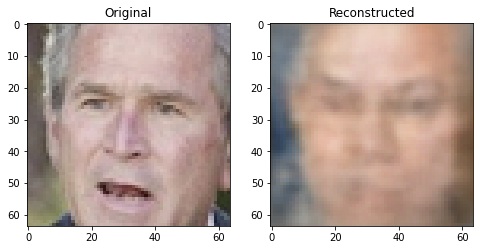

Epoch 301/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60261.6256, d_loss: 1.3711
--------------------------------------------------
Epoch 302/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60268.4689, d_loss: 1.3699
--------------------------------------------------
Epoch 303/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60271.4151, d_loss: 1.3697
--------------------------------------------------
Epoch 304/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60244.4662, d_loss: 1.3691
--------------------------------------------------
Epoch 305/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60258.7948, d_loss: 1.3670
--------------------------------------------------
Epoch 306/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60253.5664, d_loss: 1.3711
--------------------------------------------------
Epoch 307/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60258.7350, d_loss: 1.3697
--------------------------------------------------
Epoch 308/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60260.5546, d_loss: 1.3679
--------------------------------------------------
Epoch 309/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60247.6737, d_loss: 1.3685
--------------------------------------------------
Epoch 310/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60230.2519, d_loss: 1.3682
--------------------------------------------------


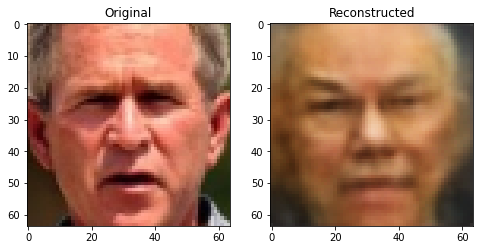

Epoch 311/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60231.7975, d_loss: 1.3682
--------------------------------------------------
Epoch 312/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60214.8042, d_loss: 1.3709
--------------------------------------------------
Epoch 313/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60215.4202, d_loss: 1.3696
--------------------------------------------------
Epoch 314/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60206.4376, d_loss: 1.3694
--------------------------------------------------
Epoch 315/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60203.7108, d_loss: 1.3671
--------------------------------------------------
Epoch 316/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60199.2132, d_loss: 1.3680
--------------------------------------------------
Epoch 317/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60204.3202, d_loss: 1.3652
--------------------------------------------------
Epoch 318/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60206.0847, d_loss: 1.3668
--------------------------------------------------
Epoch 319/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60178.9334, d_loss: 1.3683
--------------------------------------------------
Epoch 320/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60174.8806, d_loss: 1.3646
--------------------------------------------------


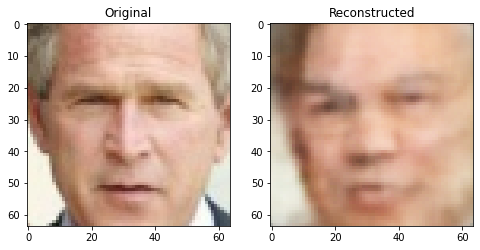

Epoch 321/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60183.5472, d_loss: 1.3662
--------------------------------------------------
Epoch 322/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60172.2385, d_loss: 1.3680
--------------------------------------------------
Epoch 323/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60171.7674, d_loss: 1.3610
--------------------------------------------------
Epoch 324/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60174.6944, d_loss: 1.3660
--------------------------------------------------
Epoch 325/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60173.2822, d_loss: 1.3620
--------------------------------------------------
Epoch 326/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60190.5382, d_loss: 1.3681
--------------------------------------------------
Epoch 327/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60176.0923, d_loss: 1.3633
--------------------------------------------------
Epoch 328/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60145.6602, d_loss: 1.3649
--------------------------------------------------
Epoch 329/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60157.0366, d_loss: 1.3571
--------------------------------------------------
Epoch 330/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60124.4974, d_loss: 1.3649
--------------------------------------------------


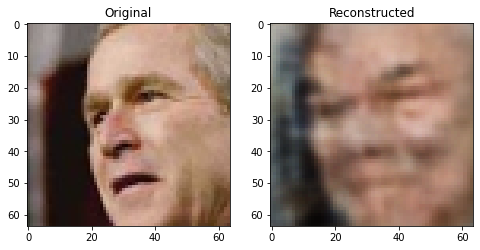

Epoch 331/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60151.2728, d_loss: 1.3649
--------------------------------------------------
Epoch 332/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60128.2823, d_loss: 1.3600
--------------------------------------------------
Epoch 333/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60153.1285, d_loss: 1.3671
--------------------------------------------------
Epoch 334/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60121.4949, d_loss: 1.3624
--------------------------------------------------
Epoch 335/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60113.7763, d_loss: 1.3671
--------------------------------------------------
Epoch 336/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60083.3936, d_loss: 1.3618
--------------------------------------------------
Epoch 337/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60127.9462, d_loss: 1.3596
--------------------------------------------------
Epoch 338/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60116.4743, d_loss: 1.3583
--------------------------------------------------
Epoch 339/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60085.2596, d_loss: 1.3674
--------------------------------------------------
Epoch 340/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60099.1698, d_loss: 1.3577
--------------------------------------------------


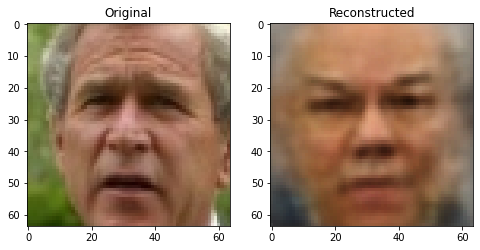

Epoch 341/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60083.4473, d_loss: 1.3594
--------------------------------------------------
Epoch 342/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60092.7247, d_loss: 1.3573
--------------------------------------------------
Epoch 343/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60079.3438, d_loss: 1.3662
--------------------------------------------------
Epoch 344/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60091.4107, d_loss: 1.3570
--------------------------------------------------
Epoch 345/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60073.0125, d_loss: 1.3589
--------------------------------------------------
Epoch 346/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60090.4259, d_loss: 1.3546
--------------------------------------------------
Epoch 347/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60079.7752, d_loss: 1.3575
--------------------------------------------------
Epoch 348/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60068.7290, d_loss: 1.3568
--------------------------------------------------
Epoch 349/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60069.8197, d_loss: 1.3583
--------------------------------------------------
Epoch 350/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60048.7677, d_loss: 1.3515
--------------------------------------------------


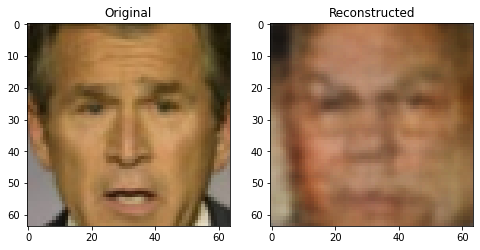

Epoch 351/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60069.1031, d_loss: 1.3588
--------------------------------------------------
Epoch 352/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60065.8854, d_loss: 1.3514
--------------------------------------------------
Epoch 353/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60033.9360, d_loss: 1.3525
--------------------------------------------------
Epoch 354/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60039.3934, d_loss: 1.3550
--------------------------------------------------
Epoch 355/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60042.1990, d_loss: 1.3544
--------------------------------------------------
Epoch 356/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60023.9274, d_loss: 1.3564
--------------------------------------------------
Epoch 357/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60042.5454, d_loss: 1.3517
--------------------------------------------------
Epoch 358/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60040.5663, d_loss: 1.3534
--------------------------------------------------
Epoch 359/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60035.5893, d_loss: 1.3560
--------------------------------------------------
Epoch 360/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60028.4757, d_loss: 1.3432
--------------------------------------------------


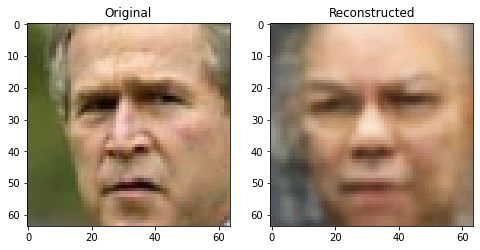

Epoch 361/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60014.1549, d_loss: 1.3479
--------------------------------------------------
Epoch 362/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60017.9776, d_loss: 1.3498
--------------------------------------------------
Epoch 363/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60028.0875, d_loss: 1.3575
--------------------------------------------------
Epoch 364/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60000.4713, d_loss: 1.3541
--------------------------------------------------
Epoch 365/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60007.7721, d_loss: 1.3473
--------------------------------------------------
Epoch 366/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60017.4977, d_loss: 1.3494
--------------------------------------------------
Epoch 367/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 60012.7972, d_loss: 1.3420
--------------------------------------------------
Epoch 368/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59986.7310, d_loss: 1.3407
--------------------------------------------------
Epoch 369/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59983.4309, d_loss: 1.3467
--------------------------------------------------
Epoch 370/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59981.8791, d_loss: 1.3495
--------------------------------------------------


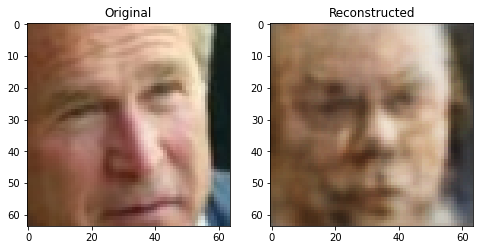

Epoch 371/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59991.5123, d_loss: 1.3467
--------------------------------------------------
Epoch 372/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59994.7306, d_loss: 1.3402
--------------------------------------------------
Epoch 373/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59981.1468, d_loss: 1.3465
--------------------------------------------------
Epoch 374/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59989.6383, d_loss: 1.3393
--------------------------------------------------
Epoch 375/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59954.8532, d_loss: 1.3389
--------------------------------------------------
Epoch 376/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59959.8605, d_loss: 1.3473
--------------------------------------------------
Epoch 377/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59961.7496, d_loss: 1.3375
--------------------------------------------------
Epoch 378/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59967.4649, d_loss: 1.3427
--------------------------------------------------
Epoch 379/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59962.4687, d_loss: 1.3332
--------------------------------------------------
Epoch 380/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59957.7606, d_loss: 1.3343
--------------------------------------------------


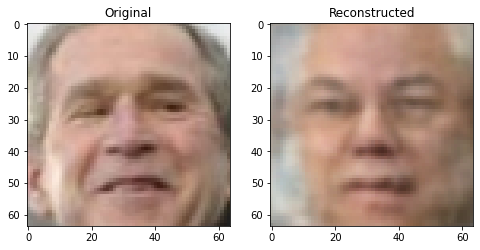

Epoch 381/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59936.0899, d_loss: 1.3431
--------------------------------------------------
Epoch 382/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59953.3614, d_loss: 1.3392
--------------------------------------------------
Epoch 383/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59931.7467, d_loss: 1.3303
--------------------------------------------------
Epoch 384/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59938.5627, d_loss: 1.3335
--------------------------------------------------
Epoch 385/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59914.6663, d_loss: 1.3394
--------------------------------------------------
Epoch 386/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59934.4220, d_loss: 1.3336
--------------------------------------------------
Epoch 387/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59927.4456, d_loss: 1.3207
--------------------------------------------------
Epoch 388/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59931.8039, d_loss: 1.3304
--------------------------------------------------
Epoch 389/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59910.1023, d_loss: 1.3321
--------------------------------------------------
Epoch 390/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59911.8517, d_loss: 1.3400
--------------------------------------------------


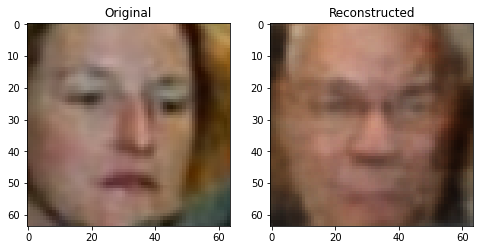

Epoch 391/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59933.5036, d_loss: 1.3273
--------------------------------------------------
Epoch 392/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59922.8283, d_loss: 1.3219
--------------------------------------------------
Epoch 393/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59915.2292, d_loss: 1.3235
--------------------------------------------------
Epoch 394/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59888.3646, d_loss: 1.3258
--------------------------------------------------
Epoch 395/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59912.0233, d_loss: 1.3270
--------------------------------------------------
Epoch 396/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59901.7626, d_loss: 1.3313
--------------------------------------------------
Epoch 397/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59892.4259, d_loss: 1.3176
--------------------------------------------------
Epoch 398/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59902.4433, d_loss: 1.3201
--------------------------------------------------
Epoch 399/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59883.9007, d_loss: 1.3218
--------------------------------------------------
Epoch 400/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59870.6560, d_loss: 1.3171
--------------------------------------------------


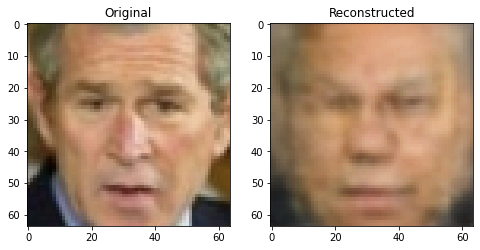

Epoch 401/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59884.1671, d_loss: 1.3187
--------------------------------------------------
Epoch 402/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59861.4165, d_loss: 1.3256
--------------------------------------------------
Epoch 403/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59871.0165, d_loss: 1.3172
--------------------------------------------------
Epoch 404/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59871.3708, d_loss: 1.3283
--------------------------------------------------
Epoch 405/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59854.6669, d_loss: 1.3322
--------------------------------------------------
Epoch 406/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59869.2389, d_loss: 1.3029
--------------------------------------------------
Epoch 407/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59862.4091, d_loss: 1.2996
--------------------------------------------------
Epoch 408/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59835.3066, d_loss: 1.3303
--------------------------------------------------
Epoch 409/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59837.3922, d_loss: 1.3105
--------------------------------------------------
Epoch 410/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59850.8322, d_loss: 1.3078
--------------------------------------------------


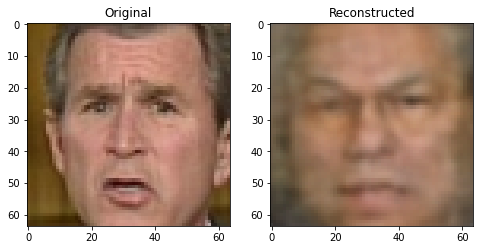

Epoch 411/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59831.3034, d_loss: 1.3260
--------------------------------------------------
Epoch 412/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59839.7377, d_loss: 1.3329
--------------------------------------------------
Epoch 413/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59836.1053, d_loss: 1.3046
--------------------------------------------------
Epoch 414/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59839.0330, d_loss: 1.3210
--------------------------------------------------
Epoch 415/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59827.8454, d_loss: 1.3205
--------------------------------------------------
Epoch 416/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59814.6505, d_loss: 1.3068
--------------------------------------------------
Epoch 417/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59831.6929, d_loss: 1.2984
--------------------------------------------------
Epoch 418/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59807.9696, d_loss: 1.3714
--------------------------------------------------
Epoch 419/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59820.3129, d_loss: 1.3431
--------------------------------------------------
Epoch 420/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59812.6025, d_loss: 1.3109
--------------------------------------------------


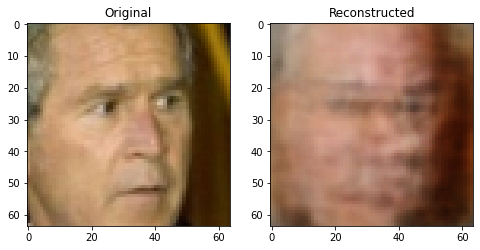

Epoch 421/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59814.2802, d_loss: 1.3019
--------------------------------------------------
Epoch 422/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59786.2701, d_loss: 1.3143
--------------------------------------------------
Epoch 423/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59807.4384, d_loss: 1.3006
--------------------------------------------------
Epoch 424/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59786.3183, d_loss: 1.2982
--------------------------------------------------
Epoch 425/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59789.0805, d_loss: 1.3023
--------------------------------------------------
Epoch 426/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59791.7353, d_loss: 1.3181
--------------------------------------------------
Epoch 427/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59797.4992, d_loss: 1.2993
--------------------------------------------------
Epoch 428/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59798.0592, d_loss: 1.3099
--------------------------------------------------
Epoch 429/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59797.9737, d_loss: 1.2966
--------------------------------------------------
Epoch 430/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59785.2648, d_loss: 1.3017
--------------------------------------------------


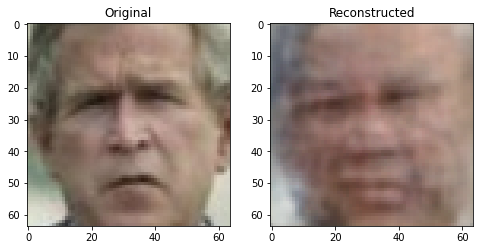

Epoch 431/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59776.6086, d_loss: 1.3055
--------------------------------------------------
Epoch 432/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59769.0104, d_loss: 1.2907
--------------------------------------------------
Epoch 433/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59759.6185, d_loss: 1.2957
--------------------------------------------------
Epoch 434/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59773.2839, d_loss: 1.2735
--------------------------------------------------
Epoch 435/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59768.1525, d_loss: 1.3021
--------------------------------------------------
Epoch 436/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59758.7089, d_loss: 1.2910
--------------------------------------------------
Epoch 437/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59762.7818, d_loss: 1.2819
--------------------------------------------------
Epoch 438/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59771.9253, d_loss: 1.2681
--------------------------------------------------
Epoch 439/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59748.8649, d_loss: 1.2909
--------------------------------------------------
Epoch 440/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59752.9691, d_loss: 1.2758
--------------------------------------------------


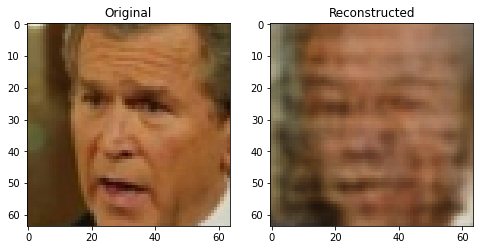

Epoch 441/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59749.3388, d_loss: 1.2858
--------------------------------------------------
Epoch 442/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59741.1656, d_loss: 1.2792
--------------------------------------------------
Epoch 443/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59737.9306, d_loss: 1.2786
--------------------------------------------------
Epoch 444/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59731.4689, d_loss: 1.2800
--------------------------------------------------
Epoch 445/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59754.9288, d_loss: 1.2674
--------------------------------------------------
Epoch 446/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59760.9396, d_loss: 1.2704
--------------------------------------------------
Epoch 447/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59732.8198, d_loss: 1.2810
--------------------------------------------------
Epoch 448/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59738.2869, d_loss: 1.2636
--------------------------------------------------
Epoch 449/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59736.5589, d_loss: 1.2841
--------------------------------------------------
Epoch 450/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59744.2341, d_loss: 1.2508
--------------------------------------------------


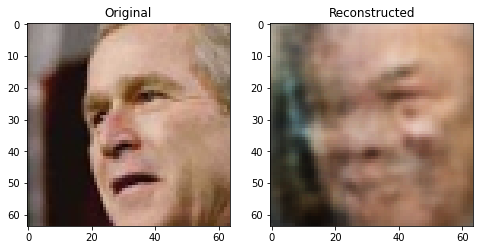

Epoch 451/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59715.4500, d_loss: 1.2810
--------------------------------------------------
Epoch 452/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59741.7650, d_loss: 1.2703
--------------------------------------------------
Epoch 453/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59699.8652, d_loss: 1.2568
--------------------------------------------------
Epoch 454/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59711.4116, d_loss: 1.2568
--------------------------------------------------
Epoch 455/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59705.5006, d_loss: 1.2844
--------------------------------------------------
Epoch 456/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59714.0117, d_loss: 1.2558
--------------------------------------------------
Epoch 457/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59710.5033, d_loss: 1.2620
--------------------------------------------------
Epoch 458/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59688.1669, d_loss: 1.2546
--------------------------------------------------
Epoch 459/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59703.2368, d_loss: 1.2727
--------------------------------------------------
Epoch 460/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59698.6573, d_loss: 1.2475
--------------------------------------------------


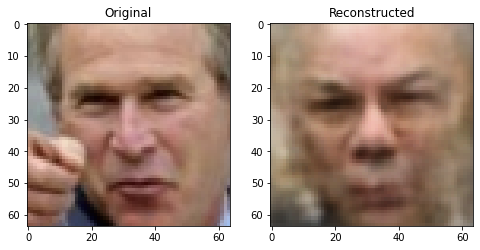

Epoch 461/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59684.9765, d_loss: 1.2833
--------------------------------------------------
Epoch 462/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59699.4323, d_loss: 1.2416
--------------------------------------------------
Epoch 463/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59704.0877, d_loss: 1.2571
--------------------------------------------------
Epoch 464/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59674.1125, d_loss: 1.2512
--------------------------------------------------
Epoch 465/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59691.6543, d_loss: 1.2405
--------------------------------------------------
Epoch 466/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59678.6966, d_loss: 1.2487
--------------------------------------------------
Epoch 467/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59682.3754, d_loss: 1.2415
--------------------------------------------------
Epoch 468/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59677.0807, d_loss: 1.2945
--------------------------------------------------
Epoch 469/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59692.4014, d_loss: 1.2513
--------------------------------------------------
Epoch 470/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59670.8154, d_loss: 1.2530
--------------------------------------------------


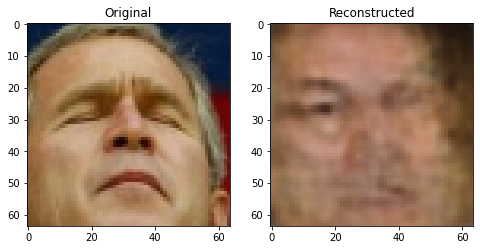

Epoch 471/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59670.6955, d_loss: 1.2527
--------------------------------------------------
Epoch 472/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59672.1739, d_loss: 1.2458
--------------------------------------------------
Epoch 473/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59668.3221, d_loss: 1.2475
--------------------------------------------------
Epoch 474/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59669.2136, d_loss: 1.2866
--------------------------------------------------
Epoch 475/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59660.9261, d_loss: 1.2281
--------------------------------------------------
Epoch 476/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59668.9517, d_loss: 1.2504
--------------------------------------------------
Epoch 477/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59680.0601, d_loss: 1.2584
--------------------------------------------------
Epoch 478/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59640.2476, d_loss: 1.2932
--------------------------------------------------
Epoch 479/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59672.9940, d_loss: 1.2303
--------------------------------------------------
Epoch 480/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59647.1035, d_loss: 1.2903
--------------------------------------------------


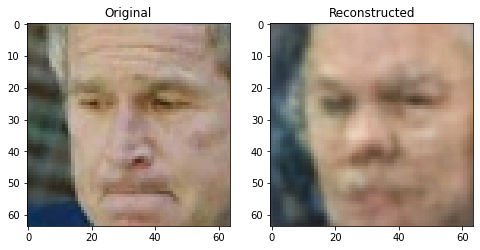

Epoch 481/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59643.7181, d_loss: 1.2292
--------------------------------------------------
Epoch 482/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59639.4039, d_loss: 1.2418
--------------------------------------------------
Epoch 483/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59643.4231, d_loss: 1.2286
--------------------------------------------------
Epoch 484/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59642.6158, d_loss: 1.2210
--------------------------------------------------
Epoch 485/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59626.3016, d_loss: 1.2532
--------------------------------------------------
Epoch 486/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59651.0860, d_loss: 1.2293
--------------------------------------------------
Epoch 487/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59623.6447, d_loss: 1.2360
--------------------------------------------------
Epoch 488/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59620.0070, d_loss: 1.2592
--------------------------------------------------
Epoch 489/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59623.6366, d_loss: 1.2149
--------------------------------------------------
Epoch 490/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59622.0682, d_loss: 1.2363
--------------------------------------------------


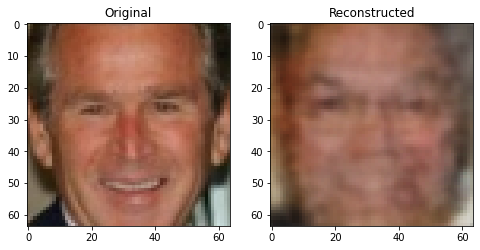

Epoch 491/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59607.8917, d_loss: 1.2094
--------------------------------------------------
Epoch 492/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59620.2788, d_loss: 1.2382
--------------------------------------------------
Epoch 493/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59612.7517, d_loss: 1.2219
--------------------------------------------------
Epoch 494/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59608.9446, d_loss: 1.2377
--------------------------------------------------
Epoch 495/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59606.1305, d_loss: 1.2319
--------------------------------------------------
Epoch 496/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59608.0295, d_loss: 1.2008
--------------------------------------------------
Epoch 497/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59602.4645, d_loss: 1.2239
--------------------------------------------------
Epoch 498/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59598.0202, d_loss: 1.2271
--------------------------------------------------
Epoch 499/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59601.5717, d_loss: 1.2199
--------------------------------------------------
Epoch 500/500


  0%|          | 0/14 [00:00<?, ?it/s]

Epoch g_loss: 59590.7158, d_loss: 1.2051
--------------------------------------------------


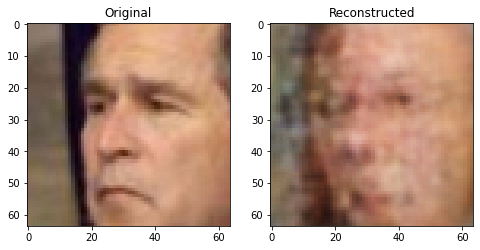

In [51]:
model.train()
D_A.train()
D_B.train()

loss_hist = {'D': list(), 'G': list()}

for epoch in range(epochs):
    print(f'Epoch {epoch+1}/{epochs}')

    g_loss = 0
    d_loss = 0

    for i, batch in enumerate(tqdm(dataloader, leave=False), 1):
        x_A, x_B = batch

        fake_A, mu_A, logvar_A = model(x_A)
        with torch.no_grad():
            fake_B, mu_B, logvar_B = model(x_B, select='B')

        d_loss += train_discriminator(D_A, criterion_D, optimizerD_A, x_A, fake_A)
        d_loss += train_discriminator(D_B, criterion_D, optimizerD_B, x_B, fake_B)
        
        g_loss += train_generator(D_A, criterion, criterion_D, optimizerA, x_A, fake_A, mu_A, logvar_A)
        fake_B, mu_B, logvar_B = model(x_B, select='B')
        g_loss += train_generator(D_B, criterion, criterion_D, optimizerB, x_B, fake_B, mu_B, logvar_B)

        fake_A2, mu_A2, logvar_A2 = model(x_A, select='B')

        g_loss += train_generator(D_B, None, criterion_D, optimizerB, x_A, fake_A2, mu_A2, logvar_A2)
        fake_B2, mu_B2, logvar_B2 = model(x_B, select='A')
        g_loss += train_generator(D_A, None, criterion_D, optimizerA, x_B, fake_B2, mu_B2, logvar_B2)

    d_loss /= i*2
    g_loss /= i*4

    loss_hist['D'].append(d_loss)
    loss_hist['G'].append(g_loss)

    print(f'Epoch g_loss: {g_loss:.4f}, d_loss: {d_loss:.4f}')
    print(50*'-')
    if (epoch + 1) % 10 == 0:
        checkpoint = { 
                          'epoch': None,
                          'model': model,
                          'D_A': D_A,
                          'D_B': D_B,
                          'optimizerA': optimizerA,
                          'optimizerB': optimizerB,
                          'optimizerD_A': optimizerD_A,
                          'optimizerD_B': optimizerD_B,
                          }
        torch.save(checkpoint, PATH)
        plot_test()

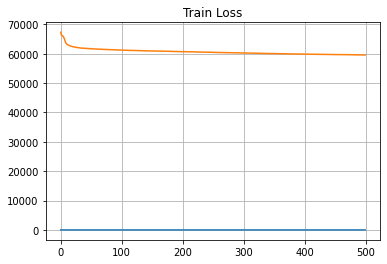

In [52]:
plt.figure(figsize=(6,4))
plt.title('Train Loss')
plt.plot(loss_hist['D'])
plt.plot(loss_hist['G'])
plt.grid()
plt.show()

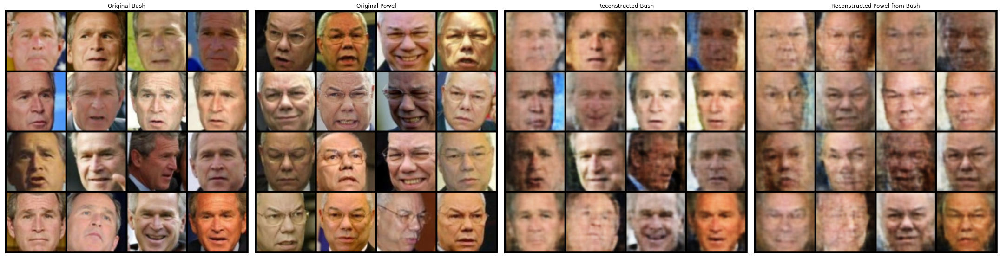

In [53]:
plt.figure(figsize=(30,30))
plt.subplot(141)
plt.title('Original Bush')
disp_tensor = next(iter(dataloader))
A = disp_tensor[0]
grid_img = torchvision.utils.make_grid(list(A), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

plt.subplot(142)
plt.title('Original Powel')
B = disp_tensor[1]
grid_img = torchvision.utils.make_grid(list(B), nrow=4)
plt.imshow(grid_img.permute(1, 2, 0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='A')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(143)
plt.title('Reconstructed Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())
plt.xticks([])
plt.yticks([])

model.eval()
y = model(disp_tensor[0], select='B')
y = y[0].clamp(0,1)
grid_img = torchvision.utils.make_grid(list(y), nrow=4)
plt.subplot(144)
plt.title('Reconstructed Powel from Bush')
plt.imshow(grid_img.permute(1,2,0).cpu().detach().numpy())

plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()

In [ ]:
# failures: if ignore smoothiness, we can conclude that the worse cases are: face expressions, non-frontal face look, quite large background area